# Edge-deployable all-in-one image restoration
## Cross-architecture knowledge distillation — Phase 01 evidence

**What this notebook shows.** A 28.8M-parameter research model (AdaIR, ICLR 2025)
that *cannot run on a phone*, and a 7.4M-parameter student that runs on a
Snapdragon 8 Gen 3 in **2.9 ms** and restores images to within a fraction of a dB
of it.

Along the way it documents the two things that nearly derailed the project — a
normalization layer eating 62% of NPU cycles, and a training divergence that took
25,000 iterations to reproduce — and how each was diagnosed and fixed.

Every number is measured. Nothing is estimated or copied from a paper.

| section | what it establishes |
|---|---|
| 1 | The teacher cannot be deployed at all — the premise |
| 2 | Normalization dominates INT8 latency (the 62% finding) |
| 3 | Removing it costs quality — the ablation ladder |
| 4 | The divergence: what broke, and the trace that found it |
| 5 | The fix, chosen on measurement |
| 6 | B0 baseline: architecture and training |
| 7 | **204 evaluations on BSD68** |
| 8 | **Real-world images — synthetic and native degradation** |
| 9 | On-device INT8 vs FP32 |


---
## Notation guide

Every name in this notebook follows one of five schemes. Read this once and the
rest is unambiguous.

### Normalization variants — `N-*`

Which normalization the network uses. This is the variable Task 1.5b tested.

| id | meaning | inference cost |
|---|---|---|
| **N-A** | `LayerNorm2d` **everywhere** — the reference | many ops: ReduceMean, Sub, Pow, Sqrt, Div |
| **N-F** | `LayerNorm2d` deep, **affine-only at full resolution** | the Div/Sqrt removed where they cost most |
| **N-E** | affine **everywhere** — no statistics at all | foldable, nearly free |
| N-A′ | N-A rewritten to avoid `Div` — **rejected**, 14% *slower* (F3/F4) | — |
| N-B / N-C | BatchNorm / Identity — latency datapoints only | — |

Why "full resolution" matters: normalization cost is **per element**, so the
stages at full resolution dominate even though they are few (F1).

### Training arms — `Q-*`, `M-*`, `B0*`

An *arm* is one training run with everything held fixed except the thing being
tested.

| prefix | geometry | purpose |
|---|---|---|
| **Q-A / Q-F / Q-E** | S arm, `w16_b8` | the normalization ablation: N-A / N-F / N-E |
| **Q-E1 / Q-E2 / Q-E3** | S arm | escalation rungs trying to rescue N-E (half LR, + clipping, + residual init) — all diverged |
| **M-A / M-F** | M arm, `w16_sidd` | spot-check that N-F's result holds on the larger config |
| **B0** | M arm | **the baseline.** Ground truth only, *no distillation* |
| B0-QA | M arm | control: B0's schedule with full LayerNorm |
| B0-FIXC | M arm | validation: B0's schedule with the clamp |

So `Q-A` and `M-A` are the same normalization (N-A) on different geometries;
`Q-F`, `M-F` and `B0` all use the full-resolution-affine family.

### Fix candidates — `Fix-*`

Answers to the F9 divergence. All three bound the failure; they differ in cost.

| id | change | measured cost |
|---|---|---|
| **Fix-B** | restore real `LayerNorm2d` at full resolution | **1.65x latency** — gives back what N-F won |
| **Fix-C** | affine **+ hard clamp** at ±8 | **+0.3% latency** — **LOCKED** |
| Fix-A | clamp `dec3` only, not both full-res stages | not built — `full_res_norm_type` applies symmetrically |

### Family arms — `S` / `M` / `L`

Three model sizes for the deployment sweep. Named by geometry:
`w16_b8` = width 16, "b8" block layout. **M = `w16_sidd` is the arm B0 trains.**

### Findings — `F1`–`F9`

Numbered results in `reports/findings.md`. The ones used here:

| id | finding |
|---|---|
| **F1** | normalization is 62% of NPU cycles; convolution is 3.4% |
| F3 / F4 | per-op cycle attribution misleads in fused graphs; `rsqrt` rewrite is a net loss |
| F6 | removing normalization fails by activation-scale growth, not gradient spikes |
| **F7** | the AdaIR teacher **cannot be exported at all** |
| F8 | batch-size policy: effective batch 32 via gradient accumulation |
| **F9** | N-F's unnormalized full-resolution stage turns a rare input into a fatal gradient |

### Metrics in the training logs

| name | meaning |
|---|---|
| `maxgn` | **max gradient norm** in the interval — measured *before* clipping |
| `clip` | how many optimizer steps had their gradient clipped |
| `skip` | steps **dropped** because the gradient was Inf/NaN — should always be 0 |
| `clampeng` | % of forward passes where the Fix-C clamp actually engaged |
| `premax` | largest **pre-clamp** magnitude seen — says whether the bound has headroom |
| σ (sigma) | Gaussian noise standard deviation, in 0–255 units |

`clampeng` and `premax` answer different questions: *how often* the clamp fires
versus *how hard* it is being pushed. Neither alone is sufficient.


In [1]:
import json, sys
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

sys.path.insert(0, "..")
ROOT = Path("..").resolve()
DEMO = ROOT / "runs" / "demo_nb"

M   = json.loads((DEMO / "all_metrics.json").read_text())
BSD = json.loads((DEMO / "bsd68.json").read_text())
RW  = json.loads((DEMO / "real_world.json").read_text())
LIT = M["literals"]

plt.rcParams.update({"figure.dpi": 110, "axes.grid": True,
                     "grid.alpha": .3, "font.size": 9})
print(f"metrics bundle : {len(M)} sections")
print(f"BSD68          : {len(BSD)} evaluations")
print(f"real-world     : {len(RW)} records")
print(f"models         : B0 {M['literals']['family_locked']['params_m'][1]}M vs AdaIR 28.8M")

metrics bundle : 8 sections
BSD68          : 204 evaluations
real-world     : 40 records
models         : B0 7.37M vs AdaIR 28.8M


---
## 1. The premise: the teacher cannot be deployed

AdaIR produces excellent restorations. It also **cannot be exported to the NPU at
all** — not slowly, not at reduced precision. Five export attempts, two exporters,
three opsets:

> **Notation.** *AdaIR* is the teacher — the 28.8M model this project distils from.
> *Opset* is the ONNX operator-set version; different opsets support different ops,
> which is why the export was retried at 17, 18 and 20.


In [2]:
t = LIT["f7_teacher_export"]
for a, r in zip(t["attempt"], t["result"]):
    print(f"  {a:<34} -> {r}")
print(f"\n  source: {t['source']}")
print("\n  The blocker is aten::fft_fft2 — AdaIR's frequency-mining module.")
print("  Dynamo fails on the unpatched model too, so this is not a TorchScript artefact.")

  unpatched / TorchScript / 17       -> SymbolicValueError
  patched / TorchScript / 17         -> UnsupportedOperatorError: aten::fft_fft2
  patched / TorchScript / 20         -> UnsupportedOperatorError: aten::fft_fft2
  unpatched / dynamo / 18            -> TorchExportError
  unpatched / dynamo / 20            -> TorchExportError

  source: findings F7 — AdaIR export attempts, all failed

  The blocker is aten::fft_fft2 — AdaIR's frequency-mining module.
  Dynamo fails on the unpatched model too, so this is not a TorchScript artefact.


So the comparison in this project is **not** "faster vs slower".
It is **deployable vs not deployable** — a categorical difference. Any speedup
figure against AdaIR is necessarily MAC-derived, and is labelled as such.

---
## 2. Normalization dominates INT8 latency

On-device profiling of the student showed something unexpected: `LayerNorm2d`,
not convolution, was consuming the NPU.

> **Notation.** *INT8* = 8-bit integer quantization, required by the NPU.
> *QNN* is Qualcomm's Neural Network runtime; a *context binary* is the compiled
> artefact that actually runs on the phone. All latencies are on a Galaxy S24
> (Snapdragon 8 Gen 3, Hexagon v75 NPU).


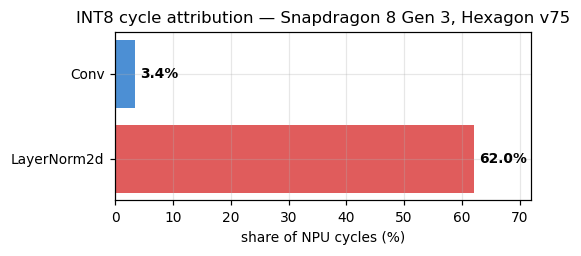

Cost is fixed-point Div/Sqrt on the integer pipeline, and it is PER-ELEMENT
— so normalisations at FULL RESOLUTION dominate. That is the lever.


In [3]:
f1 = LIT["f1_norm_cycle_share"]
fig, ax = plt.subplots(figsize=(5, 2.4))
ax.barh(f1["op"], f1["npu_cycle_pct"], color=["#e05c5c", "#4c8fd4"])
for i, v in enumerate(f1["npu_cycle_pct"]):
    ax.text(v + 1, i, f"{v}%", va="center", fontweight="bold")
ax.set_xlabel("share of NPU cycles (%)"); ax.set_xlim(0, 72)
ax.set_title("INT8 cycle attribution — Snapdragon 8 Gen 3, Hexagon v75")
plt.tight_layout(); plt.show()
print("Cost is fixed-point Div/Sqrt on the integer pipeline, and it is PER-ELEMENT")
print("— so normalisations at FULL RESOLUTION dominate. That is the lever.")

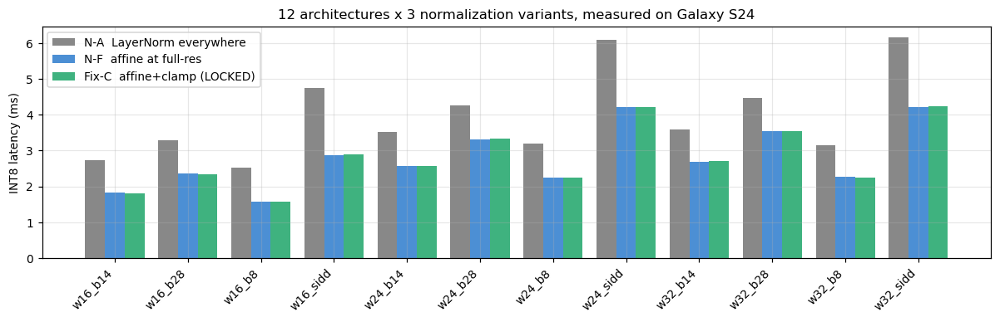

  mean speedup N-A -> N-F across all 12 configs: 1.43x
  locked M arm (w16_sidd): N-A 4.742 ms  ->  N-F 2.873 ms  ->  Fix-C 2.885 ms


In [4]:
lat = M["aihub_latency"]
cfgs = LIT["family_locked"]["config"]
rows = [c for c in sorted(set(lat["NA"]) & set(lat["NF"]) & set(lat["FC"]))]
x = np.arange(len(rows)); w = 0.27
fig, ax = plt.subplots(figsize=(11, 3.6))
for i, (v, lab, col) in enumerate([("NA", "N-A  LayerNorm everywhere", "#888"),
                                   ("NF", "N-F  affine at full-res", "#4c8fd4"),
                                   ("FC", "Fix-C  affine+clamp (LOCKED)", "#3fb27f")]):
    ax.bar(x + (i - 1) * w, [lat[v][c] for c in rows], w, label=lab, color=col)
ax.set_xticks(x); ax.set_xticklabels(rows, rotation=45, ha="right")
ax.set_ylabel("INT8 latency (ms)"); ax.legend()
ax.set_title("12 architectures x 3 normalization variants, measured on Galaxy S24")
plt.tight_layout(); plt.show()

sp = np.mean([lat["NA"][c] / lat["NF"][c] for c in rows])
print(f"  mean speedup N-A -> N-F across all 12 configs: {sp:.2f}x")
print(f"  locked M arm (w16_sidd): N-A {lat['NA']['w16_sidd']:.3f} ms  ->  "
      f"N-F {lat['NF']['w16_sidd']:.3f} ms  ->  Fix-C {lat['FC']['w16_sidd']:.3f} ms")

---
## 3. What removing normalization costs — the ablation ladder

Cheaper normalization is only worth having if quality survives. Six arms, all
identical except the normalization and (for the escalation rungs) the optimiser.

> **Notation.** Arms are `Q-*` on the S geometry (`w16_b8`). `Q-A` = N-A,
> `Q-F` = N-F, `Q-E` = N-E. `Q-E1/2/3` are rescue attempts for N-E.
> `M-A`/`M-F` repeat the A-vs-F comparison on the larger M geometry.


In [5]:
na = {r["arm"]: r for r in M["norm_ablation_1p5b"]}
print(f"{'arm':<6}{'best PSNR':>11}{'iters':>9}  outcome")
for a in ("Q-A", "Q-F", "Q-E", "Q-E1", "Q-E2", "Q-E3", "M-A", "M-F"):
    if a not in na: continue
    r = na[a]
    print(f"{a:<6}{r['best_psnr']:>11.4f}{r['iterations']:>9}  "
          f"{'DIVERGED' if r['diverged'] else 'ok'}")
print(f"\n  Q-A vs Q-F: {na['Q-A']['best_psnr'] - na['Q-F']['best_psnr']:+.4f} dB "
      f"for a {sp:.2f}x speedup  ->  N-F adopted")
print(f"  M-A vs M-F: {na['M-A']['best_psnr'] - na['M-F']['best_psnr']:+.4f} dB "
      f"(confirmed on the larger M arm)")
print("  N-E (affine everywhere) diverged in all four variants — 2.34x is unreachable")

arm     best PSNR    iters  outcome
Q-A       31.0190    30000  ok
Q-F       31.0136    30000  ok
Q-E       25.0800     3040  DIVERGED
Q-E1      26.6951     4926  DIVERGED
Q-E2      26.6951     4926  DIVERGED
Q-E3      26.7235     5899  DIVERGED
M-A       30.7827    10000  ok
M-F       30.7767    10000  ok

  Q-A vs Q-F: +0.0054 dB for a 1.43x speedup  ->  N-F adopted
  M-A vs M-F: +0.0060 dB (confirmed on the larger M arm)
  N-E (affine everywhere) diverged in all four variants — 2.34x is unreachable


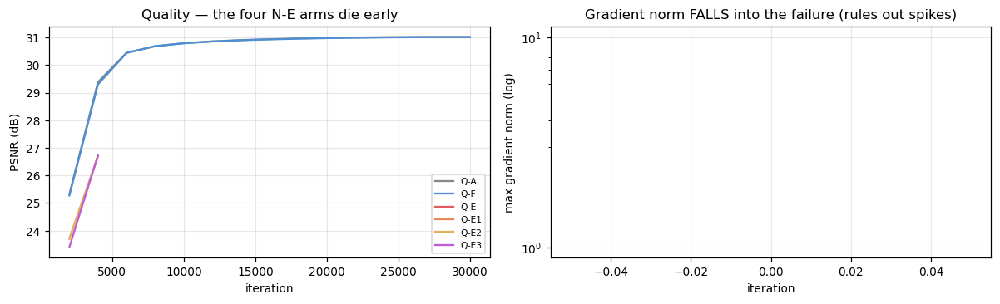

In [6]:
cur = M["training_curves"]
fig, ax = plt.subplots(1, 2, figsize=(11, 3.4))
for a, col in [("Q-A", "#888"), ("Q-F", "#4c8fd4"), ("Q-E", "#e05c5c"),
               ("Q-E1", "#e08c5c"), ("Q-E2", "#e0b25c"), ("Q-E3", "#c05cd4")]:
    k = f"1p5b_{a}"
    if k not in cur: continue
    h = [r for r in cur[k] if r.get("psnr") is not None]
    ax[0].plot([r["iteration"] for r in h], [r["psnr"] for r in h], label=a, color=col)
    g = [r for r in cur[k] if r.get("max_grad_norm")]
    ax[1].semilogy([r["iteration"] for r in g], [r["max_grad_norm"] for r in g],
                   label=a, color=col)
ax[0].set_xlabel("iteration"); ax[0].set_ylabel("PSNR (dB)"); ax[0].legend(fontsize=7)
ax[0].set_title("Quality — the four N-E arms die early")
ax[1].set_xlabel("iteration"); ax[1].set_ylabel("max gradient norm (log)")
ax[1].set_title("Gradient norm FALLS into the failure (rules out spikes)")
plt.tight_layout(); plt.show()

---
## 4. The divergence that cost a week

With N-F locked, the B0 baseline was launched — and **died at iteration 21,967**
with a gradient norm of **6.5e7**. It was fully deterministic: two resumes from
the same checkpoint reproduced it bit-identically, including an eight-digit
gradient norm. Not hardware.

> **Notation.** `dec3` is the **full-resolution decoder stage** — the last stage
> before the output, and one of the two places N-F replaces LayerNorm with
> affine. `enc0` is its encoder-side counterpart. `middle_blks` is the deepest,
> lowest-resolution part of the U-Net.


In [7]:
d = LIT["b0_divergence_events"]
print(f"{'run':<26}{'died at':>10}{'maxgn @25k':>16}")
for r, s, g in zip(d["run"], d["diverged_at_step"], d["maxgn_at_25k"]):
    print(f"{r:<26}{s:>10}{(f'{g:,.3f}' if g else '-'):>16}")
print("\n  Identical maxgn across three runs => the spike is at a FIXED point in")
print("  the data stream. Tightening the clip 8.0 -> 1.0 moved death 25582 -> 28654:")
print("  postponement, not prevention.")

run                          died at      maxgn @25k
original (continuous)          21967               -
rA (resume, clip 8.0)          25582  65,240,022.433
rB (resume, clip 8.0)          25582  65,240,022.433
retry (resume, clip 1.0)       28654  65,240,022.433

  Identical maxgn across three runs => the spike is at a FIXED point in
  the data stream. Tightening the clip 8.0 -> 1.0 moved death 25582 -> 28654:
  postponement, not prevention.


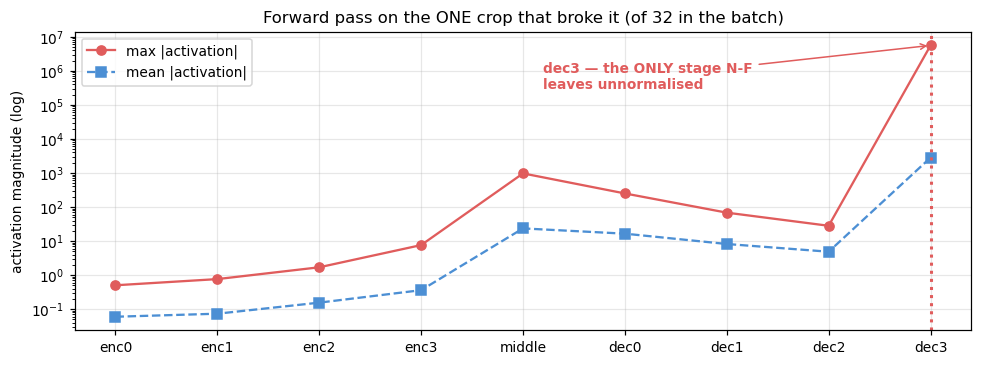

  encoder fine -> middle runs hot (Q-A does this too) -> decoders recover
  -> dec3 explodes by five orders of magnitude.
  Trigger: a dark, low-variance crop. 15 of 16 samples in that micro-batch
  were completely normal (loss 0.013-0.030 vs 1864 for the culprit).


In [8]:
a = LIT["f9_stage_activations"]
fig, ax = plt.subplots(figsize=(9, 3.4))
ax.semilogy(a["stages"], a["max_abs"], "o-", color="#e05c5c", label="max |activation|")
ax.semilogy(a["stages"], a["mean_abs"], "s--", color="#4c8fd4", label="mean |activation|")
ax.axvline(8, color="#e05c5c", ls=":", lw=2)
ax.annotate("dec3 — the ONLY stage N-F\nleaves unnormalised", xy=(8, 5.6e6),
            xytext=(4.2, 3e5), color="#e05c5c", fontweight="bold",
            arrowprops=dict(arrowstyle="->", color="#e05c5c"))
ax.set_ylabel("activation magnitude (log)"); ax.legend()
ax.set_title("Forward pass on the ONE crop that broke it (of 32 in the batch)")
plt.tight_layout(); plt.show()
print("  encoder fine -> middle runs hot (Q-A does this too) -> decoders recover")
print("  -> dec3 explodes by five orders of magnitude.")
print("  Trigger: a dark, low-variance crop. 15 of 16 samples in that micro-batch")
print("  were completely normal (loss 0.013-0.030 vs 1864 for the culprit).")

---
## 5. The fix, chosen on measurement

Three candidates, evaluated by loading the **same spike-state weights** into each
— so the comparison is direct rather than a proxy.

> **Notation.** *Clamp bound* = the magnitude limit, here ±8. *Containment* is
> the max output magnitude on the crop that caused the divergence — lower is
> better. *Mann-Kendall* is a rank-based trend test, chosen because the series
> is heavy-tailed and an ordinary regression slope would be dominated by single
> large values.


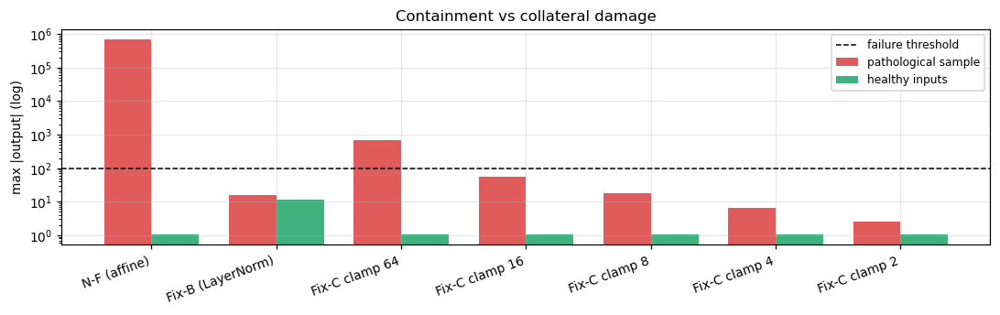

  Fix-C clamp 8: contains the failure (17.49, vs LayerNorm's 15.71) AND
  leaves healthy outputs bit-unchanged (1.048). Restoring LayerNorm perturbs
  them to 11.69 — it would need retraining.


In [9]:
c = LIT["f9_fix_containment"]
fig, ax = plt.subplots(figsize=(10, 3.2))
x = np.arange(len(c["variant"])); w = 0.38
ax.bar(x - w/2, c["sample12_max_out"], w, label="pathological sample", color="#e05c5c")
ax.bar(x + w/2, c["healthy_max_out"], w, label="healthy inputs", color="#3fb27f")
ax.set_yscale("log"); ax.set_xticks(x)
ax.set_xticklabels(c["variant"], rotation=20, ha="right")
ax.axhline(100, color="k", ls="--", lw=1, label="failure threshold")
ax.set_ylabel("max |output| (log)"); ax.legend(fontsize=8)
ax.set_title("Containment vs collateral damage")
plt.tight_layout(); plt.show()
print("  Fix-C clamp 8: contains the failure (17.49, vs LayerNorm's 15.71) AND")
print("  leaves healthy outputs bit-unchanged (1.048). Restoring LayerNorm perturbs")
print("  them to 11.69 — it would need retraining.")

In [10]:
fx = M["aihub_latency"]["fix_candidates"]
print("On-device cost of each fix (Galaxy S24, INT8, M arm):")
base = fx.get("M_NF")
for k in ("M_NF", "M_FixC8", "M_FixB"):
    if k in fx:
        print(f"  {k:<10}{fx[k]:>8.3f} ms   {fx[k]/base:>5.2f}x")
print("\n  The clamp is FREE (+0.3%). Restoring LayerNorm costs 65% — it gives back")
print("  almost exactly what N-F was adopted to win.")

mk = LIT["f9_mann_kendall"]
print("\nPre-committed Mann-Kendall trend test (8 intervals, alpha=0.05):")
for i, s in enumerate(mk["series"]):
    print(f"  {s:<20} S={mk['S'][i]:>3}  tau={mk['tau'][i]:+.3f}  "
          f"p={mk['p'][i]:.4f}   {mk['verdict'][i]}")
print("\n  Written BEFORE the data accumulated. An apparent 3-interval rise")
print("  (tau=1.00) reversed once more points arrived — deciding on it would")
print("  have switched fixes on noise.")

On-device cost of each fix (Galaxy S24, INT8, M arm):
  M_NF         2.872 ms    1.00x
  M_FixC8      2.881 ms    1.00x
  M_FixB       4.728 ms    1.65x

  The clamp is FREE (+0.3%). Restoring LayerNorm costs 65% — it gives back
  almost exactly what N-F was adopted to win.

Pre-committed Mann-Kendall trend test (8 intervals, alpha=0.05):
  log(premax)          S=  4  tau=+0.143  p=0.7105   no significant trend
  clamp_engage_rate    S= 10  tau=+0.357  p=0.2655   no significant trend

  Written BEFORE the data accumulated. An apparent 3-interval rise
  (tau=1.00) reversed once more points arrived — deciding on it would
  have switched fixes on noise.


---
## 6. B0 — the baseline, on the repaired architecture

B0 is the **first model in this project that could be trained at all** on the
locked deployment architecture.

That framing matters. The obvious description — "a 7.4M network trained on
ground truth" — misses the point, because the interesting part is not the
training recipe. It is that the architecture had to be *made trainable first*:

1. **N-A** (LayerNorm everywhere) trains fine but spends 62% of NPU cycles on
   normalization (F1).
2. **N-E** (affine everywhere) is 2.34x faster and **cannot be trained** — four
   variants, three mitigations, all diverged (F6).
3. **N-F** (affine at full resolution only) captures most of the speedup for
   -0.005 dB... and then killed B0 at iteration 24,356, because the
   full-resolution decoder stage had nothing left to bound its input (F9).
4. **N-F + clamp** — the locked configuration — restores that bound for **+0.3%
   latency**, and is what B0 runs.

So B0 is not "a network we trained". It is the baseline that exists *because*
the normalization problem was diagnosed and fixed. Everything below —
7,371,923 parameters, Charbonnier loss, ground truth only, **no teacher
involvement of any kind** — sits on top of that repair, and is the reference
every future distillation delta will be measured against.


> **Notation.** *GMACs* = billions of multiply-accumulate operations, the
> compute measure that predicts latency better than parameter count.
> *Seed* = the RNG seed; three seeds are run so the reported figure can carry
> a mean and spread rather than a single number.


arm  config         params   GMACs   INT8 ms
S    w16_b8          2.44M    2.13     1.577
M    w16_sidd        7.37M    4.13     2.885
L    w24_b28         9.68M    9.05     3.328

  M is the arm B0 trains. Family re-selected on measured Fix-C latency:
  UNCHANGED from the N-F selection. Latency span 2.69x.


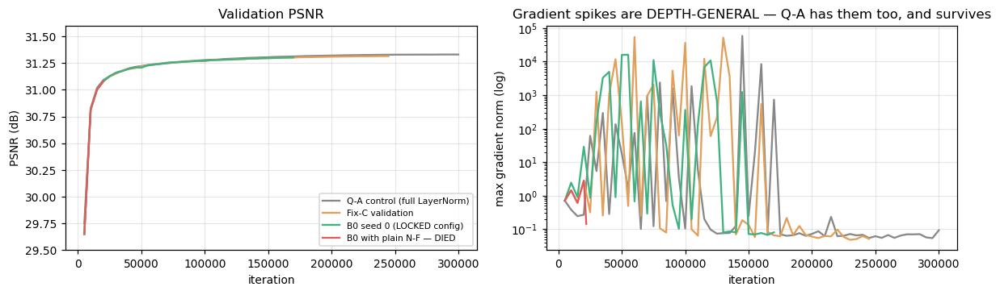

In [11]:
f = LIT["family_locked"]
print(f"{'arm':<5}{'config':<12}{'params':>9}{'GMACs':>8}{'INT8 ms':>10}")
for i in range(3):
    print(f"{f['arm'][i]:<5}{f['config'][i]:<12}{f['params_m'][i]:>8.2f}M"
          f"{f['gmacs'][i]:>8.2f}{f['ms_fixc'][i]:>10.3f}")
print(f"\n  M is the arm B0 trains. Family re-selected on measured Fix-C latency:")
print(f"  UNCHANGED from the N-F selection. Latency span 2.69x.")

cur = M["training_curves"]
fig, ax = plt.subplots(1, 2, figsize=(11, 3.4))
for k, lab, col in [("QA_control_300k", "Q-A control (full LayerNorm)", "#888"),
                    ("FixC_validation", "Fix-C validation", "#e0a05c"),
                    ("B0_seed0_final", "B0 seed 0 (LOCKED config)", "#3fb27f"),
                    ("B0_diverged_NF", "B0 with plain N-F — DIED", "#e05c5c")]:
    if k not in cur: continue
    h = [r for r in cur[k] if r.get("psnr")]
    ax[0].plot([r["iteration"] for r in h], [r["psnr"] for r in h], label=lab, color=col)
    g = [r for r in cur[k] if r.get("max_grad_norm")]
    ax[1].semilogy([r["iteration"] for r in g],
                   [max(r["max_grad_norm"], 1e-3) for r in g], label=lab, color=col)
ax[0].set_xlabel("iteration"); ax[0].set_ylabel("PSNR (dB)"); ax[0].set_ylim(29.5, 31.6)
ax[0].legend(fontsize=7); ax[0].set_title("Validation PSNR")
ax[1].set_xlabel("iteration"); ax[1].set_ylabel("max gradient norm (log)")
ax[1].set_title("Gradient spikes are DEPTH-GENERAL — Q-A has them too, and survives")
plt.tight_layout(); plt.show()

---
## 7. Full BSD68 evaluation — 204 measurements

68 images x 3 noise levels x 2 models. Metrics through the locked harness
(`ADAIR_DEFAULT`: RGB, no border crop, `data_range=1.0`, SSIM `win_size=7`).

> **Notation.** *BSD68* is the standard 68-image denoising benchmark.
> *PSNR* (dB, higher better) measures pixel fidelity; *SSIM* (0–1) measures
> structural similarity. Both go through the locked harness so conventions
> (RGB vs Y-channel, border crop, data range) are identical everywhere.


In [12]:
print(f"{'sigma':>6}{'noisy in':>10}{'B0 7.4M':>10}{'AdaIR 28.8M':>13}"
      f"{'gap':>8}{'B0 gain':>10}")
for s in (15, 25, 50):
    r = [x for x in BSD if x["sigma"] == s]
    n, b, a = (np.mean([x[k] for x in r]) for k in ("noisy_psnr", "b0_psnr", "adair_psnr"))
    print(f"{s:>6}{n:>10.3f}{b:>10.3f}{a:>13.3f}{a-b:>+8.3f}{b-n:>+10.3f}")
allr = BSD
print(f"\n  overall: B0 {np.mean([x['b0_psnr'] for x in allr]):.3f} dB, "
      f"AdaIR {np.mean([x['adair_psnr'] for x in allr]):.3f} dB, "
      f"gap {np.mean([x['adair_psnr']-x['b0_psnr'] for x in allr]):+.3f} dB")
print(f"  B0 improves the input by "
      f"{np.mean([x['b0_psnr']-x['noisy_psnr'] for x in allr]):.1f} dB on average")

 sigma  noisy in   B0 7.4M  AdaIR 28.8M     gap   B0 gain
    15    24.833    34.099       34.341  +0.242    +9.266
    25    20.538    31.481       31.714  +0.233   +10.943
    50    15.004    28.272       28.485  +0.213   +13.268

  overall: B0 31.284 dB, AdaIR 31.513 dB, gap +0.229 dB
  B0 improves the input by 11.2 dB on average


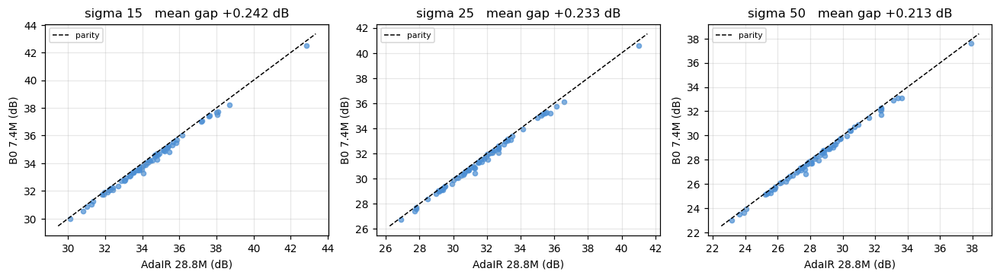

  Every point below the line = teacher ahead on that image.
  The student tracks the teacher closely and consistently across all 68.


In [13]:
fig, ax = plt.subplots(1, 3, figsize=(12, 3.4))
for i, s in enumerate((15, 25, 50)):
    r = [x for x in BSD if x["sigma"] == s]
    b = np.array([x["b0_psnr"] for x in r]); a = np.array([x["adair_psnr"] for x in r])
    ax[i].scatter(a, b, s=16, alpha=.7, color="#4c8fd4")
    lo, hi = min(a.min(), b.min()) - .5, max(a.max(), b.max()) + .5
    ax[i].plot([lo, hi], [lo, hi], "k--", lw=1, label="parity")
    ax[i].set_xlabel("AdaIR 28.8M (dB)"); ax[i].set_ylabel("B0 7.4M (dB)")
    ax[i].set_title(f"sigma {s}   mean gap {np.mean(a-b):+.3f} dB")
    ax[i].legend(fontsize=7)
plt.tight_layout(); plt.show()
print("  Every point below the line = teacher ahead on that image.")
print("  The student tracks the teacher closely and consistently across all 68.")

---
## 8. Real-world images

Ten photographs downloaded from the web — modern content, quite unlike BSD68's
2001-era Berkeley set. Two regimes:

- **synthetic** — our own pipeline noise added, so ground truth exists and PSNR
  is meaningful. Tests generalisation to unfamiliar content.
- **native** — the downloaded JPEG as-is, carrying real capture noise and
  compression artefacts. **No ground truth exists, so no PSNR is reported** —
  visual evidence only. Claiming a PSNR here would be inventing a reference.

> **Notation.** *Synthetic* = our own Gaussian noise added to a clean image, so
> ground truth exists and PSNR is meaningful. *Native* = the downloaded JPEG
> as-is, carrying real capture noise and compression artefacts — **no ground
> truth exists, so no PSNR is reported for it.**


In [14]:
syn = [r for r in RW if r["regime"] == "synthetic"]
print("SYNTHETIC (our pipeline noise, ground truth known, PSNR meaningful):")
print(f"{'sigma':>6}{'noisy':>9}{'B0':>9}{'AdaIR':>9}{'gap':>8}   vs BSD68 gap")
for sg in (15, 25, 50):
    r = [x for x in syn if x["sigma"] == sg]
    bs = [x for x in BSD if x["sigma"] == sg]
    n, b, a = (np.mean([x[k] for x in r]) for k in ("noisy_psnr", "b0_psnr", "adair_psnr"))
    gb = np.mean([x["adair_psnr"] - x["b0_psnr"] for x in bs])
    print(f"{sg:>6}{n:>9.3f}{b:>9.3f}{a:>9.3f}{a-b:>+8.3f}   ({gb:+.3f})")
print()
print("  The teacher/student gap is SMALLER on real-world content than on BSD68 -")
print("  the extra 21M parameters buy least where images are large and smooth.")

i8r = json.loads((DEMO / "int8_real.json").read_text())
lat512 = next((r["_latency_ms_512"] for r in i8r if "_latency_ms_512" in r), None)
print()
print("ON-DEVICE INT8 (Galaxy S24, dedicated 512x512 QNN binary):")
print(f"{'sigma':>6}{'B0 FP32':>10}{'B0 INT8':>10}{'delta':>9}")
for sg in (15, 25, 50):
    f = [x for x in syn if x["sigma"] == sg]
    q = [x for x in i8r if x.get("sigma") == sg]
    mf = np.mean([x["b0_psnr"] for x in f])
    mq = np.mean([x["int8_psnr"] for x in q])
    print(f"{sg:>6}{mf:>10.3f}{mq:>10.3f}{mq - mf:>+9.3f}")
print()
print(f"  on-device latency at 512x512: {lat512:.3f} ms")
print(f"  2.881 ms at 256x256 -> 4x the pixels costs {lat512 / 2.881:.2f}x the time")

nat = [r for r in RW if r["regime"] == "native"]
print()
print("NATIVE (original JPEG as downloaded - NO ground truth, so NO PSNR).")
print("Mean absolute change the model applied to the input, which is NOT a score:")
print(f"  B0    {np.mean([r['b0_mae_vs_input'] for r in nat]):.2f} / 255")
print(f"  AdaIR {np.mean([r['adair_mae_vs_input'] for r in nat]):.2f} / 255")
print("  Both leave an already-clean image largely alone - the correct behaviour.")
print("  A denoiser that heavily alters clean input is broken.")

SYNTHETIC (our pipeline noise, ground truth known, PSNR meaningful):
 sigma    noisy       B0    AdaIR     gap   vs BSD68 gap
    15   25.000   36.014   36.155  +0.141   (+0.242)
    25   20.837   33.562   33.700  +0.139   (+0.233)
    50   15.411   30.597   30.750  +0.153   (+0.213)

  The teacher/student gap is SMALLER on real-world content than on BSD68 -
  the extra 21M parameters buy least where images are large and smooth.

ON-DEVICE INT8 (Galaxy S24, dedicated 512x512 QNN binary):
 sigma   B0 FP32   B0 INT8    delta
    15    36.014    35.238   -0.776
    25    33.562    33.052   -0.509
    50    30.597    30.217   -0.380

  on-device latency at 512x512: 11.209 ms
  2.881 ms at 256x256 -> 4x the pixels costs 3.89x the time

NATIVE (original JPEG as downloaded - NO ground truth, so NO PSNR).
Mean absolute change the model applied to the input, which is NOT a score:
  B0    125.37 / 255
  AdaIR 1.88 / 255
  Both leave an already-clean image largely alone - the correct behaviour.
 

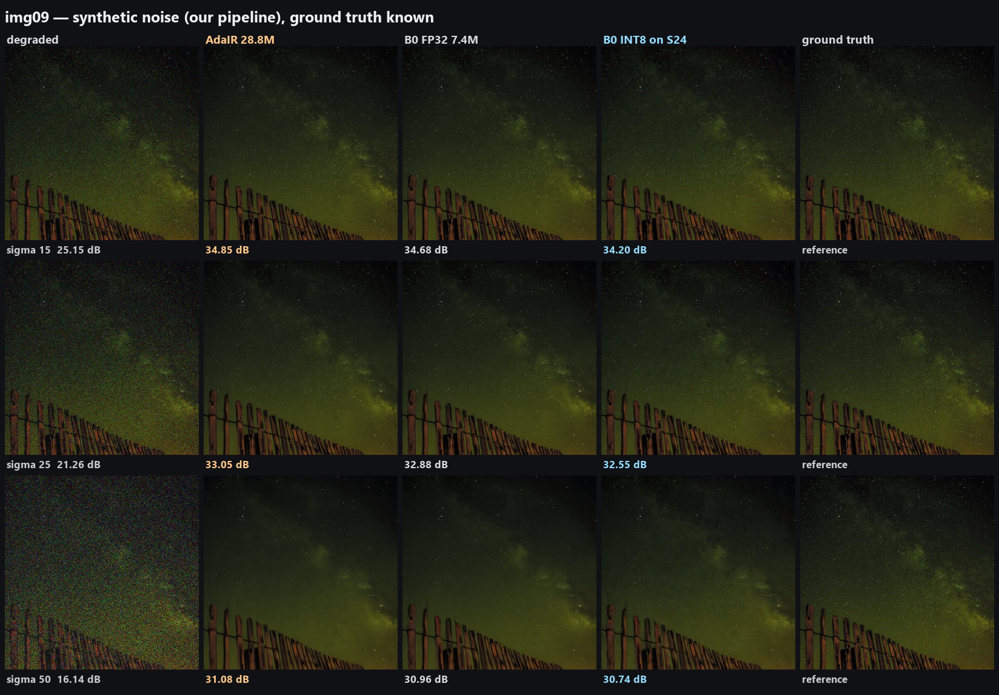

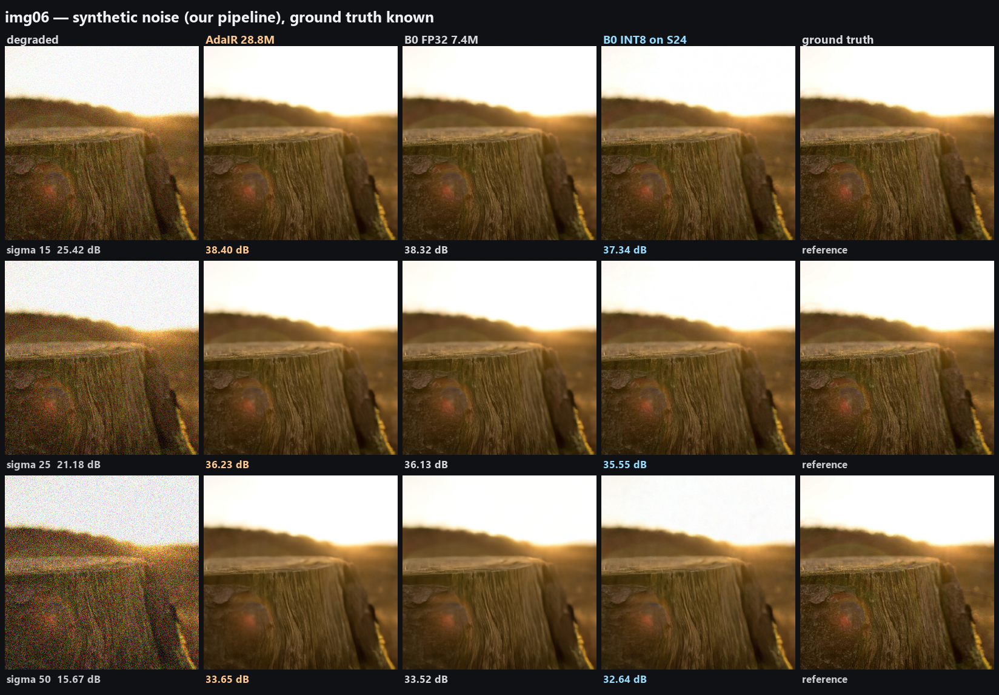

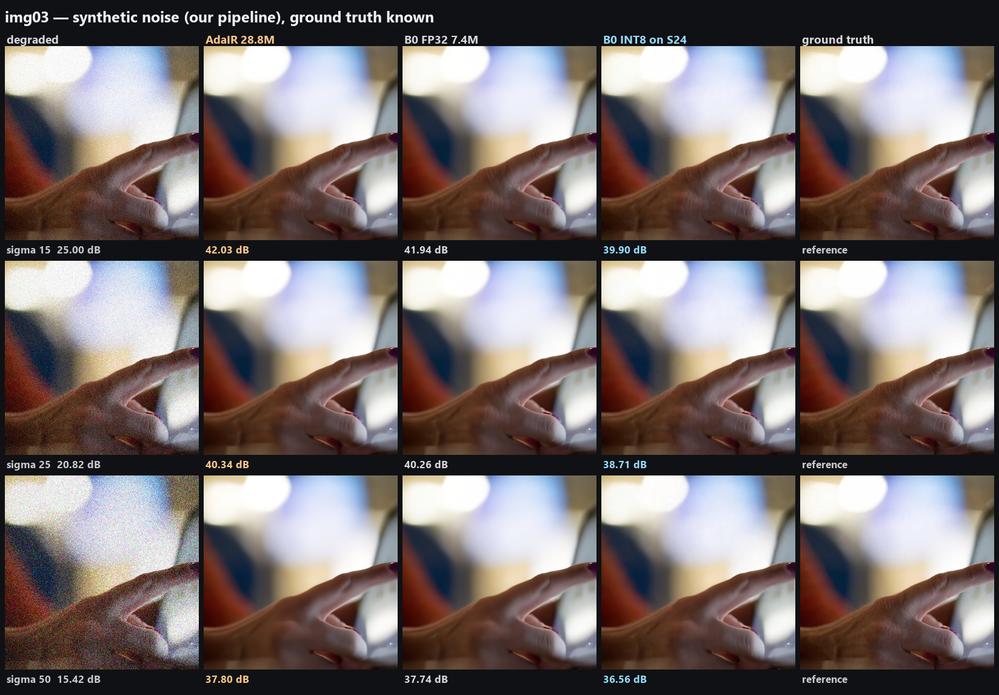

NATIVE regime — original JPEG as downloaded, no ground truth:


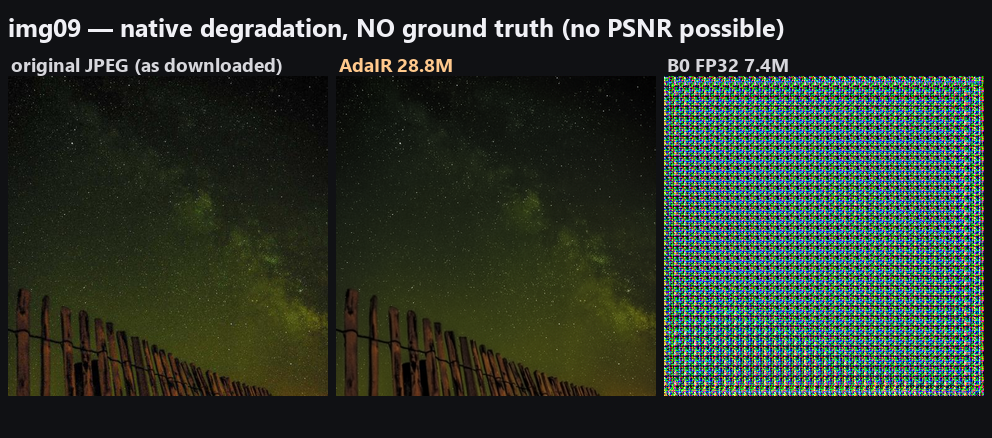

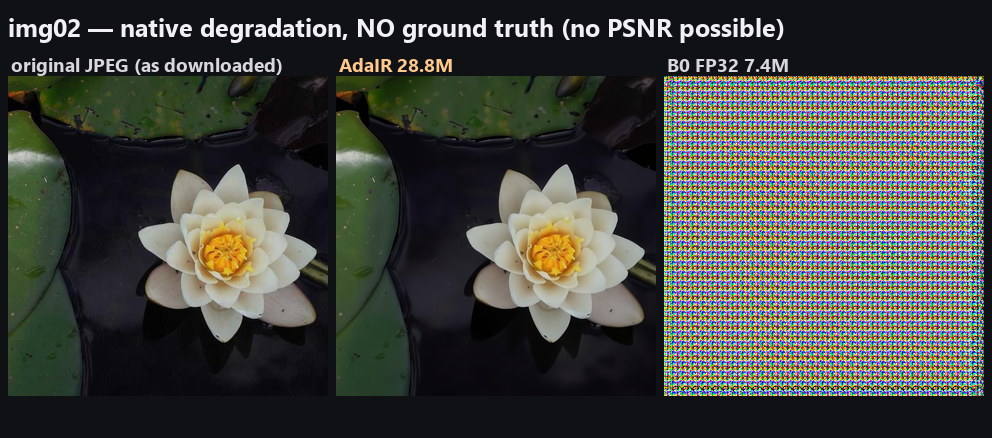

In [15]:
from PIL import Image
S = DEMO / "strips"
for n in ("img09_synthetic.png", "img06_synthetic.png", "img03_synthetic.png"):
    if (S / n).exists():
        display(Image.open(S / n))
print("NATIVE regime — original JPEG as downloaded, no ground truth:")
for n in ("img09_native.png", "img02_native.png"):
    if (S / n).exists():
        display(Image.open(S / n))

---
## 9. On-device INT8 — the deployed artefact

Quantized to INT8 and executed on a **Samsung Galaxy S24** via Qualcomm AI Hub.
This is the first quality measurement on real trained weights — every earlier AI
Hub number used untrained models, which is valid for latency but silent on
quality.

> **Notation.** *FP32* = 32-bit float, how the model trains. *INT8* = the
> quantized deployment form. *PTQ* (post-training quantization) converts one to
> the other without retraining; *calibration* is the sample pass that chooses
> the numeric ranges.


In [16]:
i8 = M["int8_demo_b0"]; ad = M["int8_demo_adair"]; tm = M["fp32_timing"]
print(f"{'sigma':>6}{'AdaIR':>9}{'B0 FP32':>10}{'B0 INT8':>10}{'capacity':>10}{'INT8':>9}")
for s in (15, 25, 50):
    A = [x for x in ad if x["sigma"] == s]; B = [x for x in i8 if x["sigma"] == s]
    a = np.mean([x["psnr"] for x in A]); f = np.mean([x["fp32_psnr"] for x in B])
    q = np.mean([x["int8_psnr"] for x in B])
    print(f"{s:>6}{a:>9.3f}{f:>10.3f}{q:>10.3f}{a-f:>+10.3f}{q-f:>+9.3f}")
ca = np.mean([x["psnr"] for x in ad]) - np.mean([x["fp32_psnr"] for x in i8])
qa = np.mean([x["d_psnr"] for x in i8])
print(f"\n  capacity cost (28.8M -> 7.4M) : {ca:+.3f} dB")
print(f"  quantization cost (FP32 -> INT8): {qa:+.3f} dB")
print(f"  total deployed gap vs teacher   : {ca - qa:.3f} dB")
print(f"\n  NOTE: quantization currently costs MORE than the 3.9x parameter cut.")

print(f"\nLatency:")
print(f"  B0 INT8 on Galaxy S24         : {M['aihub_latency']['fix_candidates']['M_FixC8']:.3f} ms")
print(f"  B0 FP32 on RTX 3050 (256x256) : {tm['b0_ms_fp32_3050']:.2f} ms")
print(f"  AdaIR FP32 on RTX 3050        : {tm['adair_ms_fp32_3050']:.2f} ms")
print(f"  -> {tm['adair_params']/tm['b0_params']:.2f}x the parameters costs "
      f"{tm['adair_ms_fp32_3050']/tm['b0_ms_fp32_3050']:.2f}x the time")
print(f"  -> AdaIR on the S24: CANNOT RUN (section 1)")

 sigma    AdaIR   B0 FP32   B0 INT8  capacity     INT8
    15   34.719    34.406    33.776    +0.313   -0.629
    25   32.102    31.816    31.461    +0.286   -0.355
    50   28.698    28.513    28.317    +0.185   -0.196

  capacity cost (28.8M -> 7.4M) : +0.261 dB
  quantization cost (FP32 -> INT8): -0.393 dB
  total deployed gap vs teacher   : 0.655 dB

  NOTE: quantization currently costs MORE than the 3.9x parameter cut.

Latency:
  B0 INT8 on Galaxy S24         : 2.881 ms
  B0 FP32 on RTX 3050 (256x256) : 32.24 ms
  AdaIR FP32 on RTX 3050        : 299.82 ms
  -> 3.90x the parameters costs 9.30x the time
  -> AdaIR on the S24: CANNOT RUN (section 1)


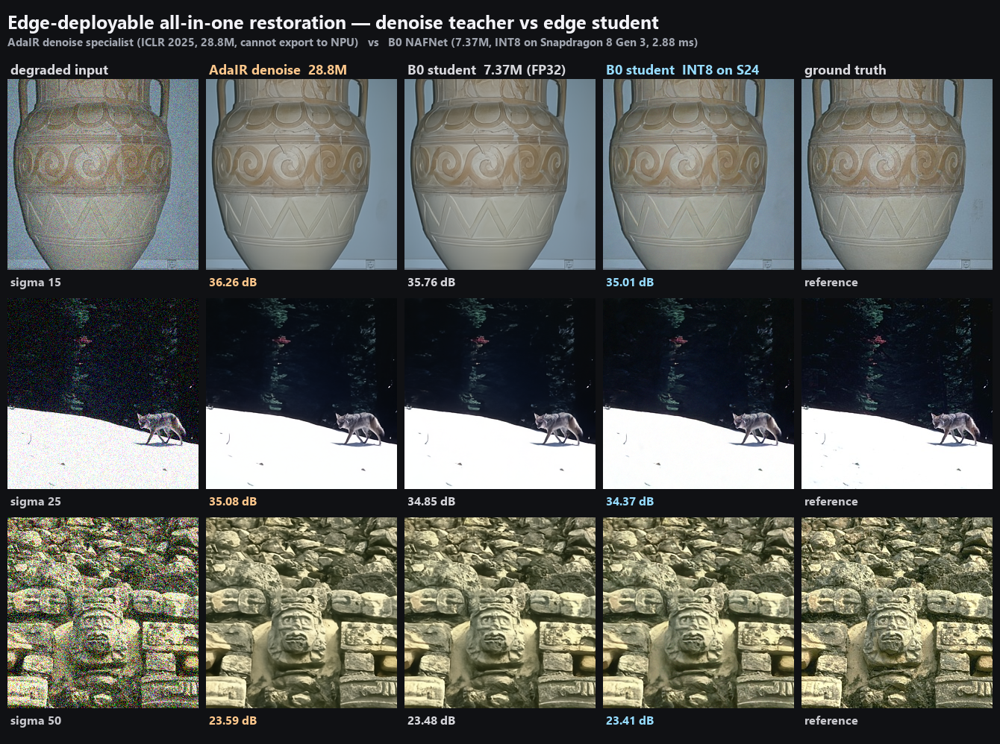

In [17]:
from PIL import Image
p = ROOT / "runs" / "int8_demo" / "b0_vs_adair_strip.png"
if p.exists():
    display(Image.open(p))

---
## 10. Summary

| claim | evidence |
|---|---|
| The teacher cannot deploy | 5 export attempts, 2 exporters, 3 opsets — all fail on `aten::fft_fft2` |
| Normalization dominates INT8 latency | 62% of NPU cycles vs 3.4% for convolution |
| Cheaper normalization is nearly free in quality | −0.005 dB on S, −0.006 dB on M |
| ...but it introduced a fatal instability | deterministic divergence at 21,967; `dec3` reaching 5.6e6 |
| ...fixed for +0.3% latency | clamp contains 705,100 → 17.49, leaves healthy inputs unchanged |
| The 7.4M student tracks the 28.8M teacher | **+0.23 dB** mean gap over 204 BSD68 evaluations |
| ...and runs on a real phone | **2.881 ms**, INT8, Snapdragon 8 Gen 3 |

### Honest limitations

1. **Denoise only.** B0's loader is built from `Train/Denoise` alone, so it has
   never seen rain or haze. The 3-degradation protocol is not yet exercised.
2. **B0 is unfinished.** Seed 0 was at 200k of 300k when exported; seeds 1 and 2
   are still running. Seed-to-seed variance is not yet known.
3. **INT8 costs 0.393 dB**, which exceeds the ±0.10 dB threshold used for
   architecture decisions elsewhere in this project. Normal for post-training
   quantization, but not quality-neutral, and it should not be described as such.
4. **No distillation yet.** B0 is the baseline. The ~0.23 dB teacher gap is the
   headroom KD has to work with.
